# Getting Started

## Contents

1.  [Setting up the python environment](#setting-up-the-python-environment) 
    - [Using `pip3`](#using-pip3)
    - [Using `conda`](#using-conda)
    - [Installing Jupyter Notebook](#installing-jupyter-notebook)

2.  [Getting the data](#getting-the-data)

3.  [Basic Operations](#basic-operations)

## Setting up the python environment

`python` has been chosen as the main language of this book, for several reasons. It doesn't have too much jargon, and the signal-to-noise ratio in code is very high (it's almost pseudocode). While `python` is not the optimal language for scientific computing, it is familiar to most people with basic knowledge of programming, and the learning curve for `python` is not as steep as `C++`, `Java`, or `Julia`. One of the drawbacks associated with using `python` is that it doesn't handle large graphs or datasets very well. `C++` and `Java` both deal with larger structures more efficienly, and many authors of seminal papers in the field of GIS provide `C++` and `Java` implementations alongside their papers. `Julia`, on the other hand, is a perfect midpoint between `python` and `C++`/`Java`. It maintains the readability of `python` but was developed specifically for scientific computing applications. 

For the sake of accessibility, the example and exercises in this book will be based entirely in `python`. Implementations in other languages are welcome as pull requests. Simply make a PR of this repo and we'll include any submissions that look promising.

From this point forward, we'll assume that you already have `python 3.6+` installed on your system. For installation instructions specific to your operating system, see this [Beginner's Guide](https://wiki.python.org/moin/BeginnersGuide/Download).

There are two primary ways to install the required packages you'll need: `pip` and `conda`. We recommend using `pip` as `conda` may have some adverse effects on system dependencies when used improperly in Linux.

:::{note}
If you intend on developing in Windows, we recommend that you leverage the convenience of the Windows Subsystem for Linux (WSL). This allows you to use the full capabilities of Linux from within Windows. You can read more about setting up WSL [here](https://docs.microsoft.com/en-us/windows/wsl/install-win10). After enabling WSL, you can proceed with the rest of this book as if you were operating in Linux.
:::

### Using `pip3`

Execute the following commands in your terminal:

````{tab} Linux
```bash
$ sudo apt update
$ sudo apt install python3-pip

```

Install `venv` and create a python virtual environment:

```bash
$ sudo apt install python3.8-venv
$ mkdir <new directory for venv>
$ python3 -m venv <path to venv directory>
```
Make sure that you replace `python3.8` with the version of `python` you are using.

````


````{tab} MacOS
```bash
$ python3 -m ensurepip --upgrade
```

`venv` in included with `python3.8+`. You can run the following command to create a virtual environment.

```bash
$ mkdir <new directory for venv>
$ python3 -m venv <path to venv directory>
```
````
You can now access your `venv` using the following command:
```bash
$ source <path to venv>/bin/activate
```

### Using `conda`

Install `conda` for your OS using the guide found [here](https://conda.io/projects/conda/en/latest/user-guide/install/index.html). 

You can create a `conda` environment like this:
```bash
$ conda create --name <name of env> python=<your version of python>
```

Access the newly-created environment using this command:
```bash
$ conda activate <your env name>
```

### Installing Jupyter Notebook

All of the code in this book is stored in Jupyter Notebooks (`.ipynb`). To access these files directly, you have two options:

1. Open **Binder** or **Google Colab** using the <i class="fas fa-rocket"></i> icon on the top right of a page containing `python` code.
2. Install Jupyter Notebook locally.

Jupyter Notebook can be installed as follows:

````{tab} pip3
```bash
$ pip3 install jupyterlab
$ pip3 install notebook
```
````
````{tab} conda
```bash
$ conda install -c conda-forge jupyterlab
$ conda install -c conda-forge notebook
```
````

## Getting the data

Most of the data used in this book will be sourced from OpenStreetMaps. For any other datasets that are not OSM-related, you can download the data in whatever format it is available in, and import it into `python` using the appropriate methods. Open Data websites hosted by various government bodies are a great source of data related to infrastructure, population metrics, and land use. See the [Datasets](Datasets.md) page for some examples.

For OpenStreetMaps, there are two primary ways of retrieving the data:
1. Download the data as-is from OpenStreetMaps' website and use tools like `osmfilter` to tune it as needed. This is not recommended as it is more difficult and not very efficient.
2. Use OpenStreetMaps' API (Overpass API) to query for data. This filters the data on the fly and you only retrieve what you need. The API is accessible in both `Java` and `python`.

:::{admonition} Data Completeness
:class: tip
The data from OSM is not always "complete". This doesn't mean that there are major uncharted regions, but rather that neighbouring nodes are not always grouped correctly. For some nodes where there are feasible connections between them in real life, OSM still represents them as having no [way](https://wiki.openstreetmap.org/wiki/Way) or [relation](https://wiki.openstreetmap.org/wiki/Relation) connecting them. This means that using the `osmnx` parser will result in the nodes being placed in separate graph components, which is not accurate to real-world conditions. We can use `osrm` to find routes between these kind of nodes and thus "complete" the graphs.

You can read more about the completeness of OpenStreetMaps data here:
1. [Completeness](https://wiki.openstreetmap.org/wiki/Completeness)
2. [Completeness Metrics](https://wiki.openstreetmap.org/wiki/ONS_Completeness_Metrics)
:::

## Basic Operations

This section contains a non-exhaustive list of operations on geospatial data that you should familiarize yourself with. More information can be found by consulting the [Tools and Python Libraries](ToolsAndPythonLibraries.md) page or the respective libary's API documentation.

### Creating a Graph from a named place

`osmnx` can convert a text descriptor of a place into a `networkx` graph. Let's use the University of Toronto as an example:

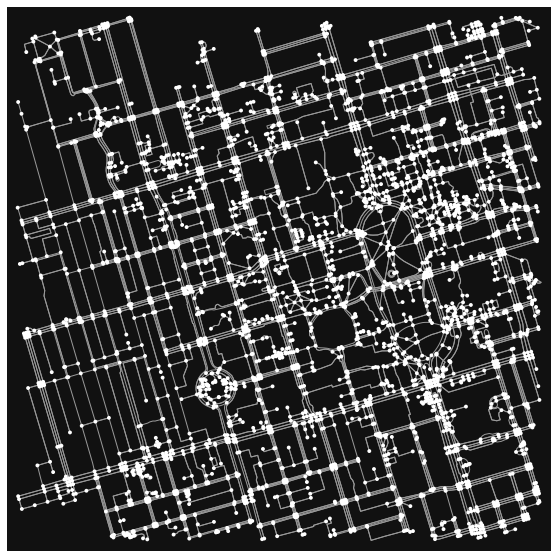

(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

In [1]:
import osmnx

place_name = "University of Toronto"


# networkx graph of the named place
graph = osmnx.graph_from_address(place_name)

# Plot the graphs
osmnx.plot_graph(graph,figsize=(10,10))

The graph shows edges and nodes of the road network surrouding the University of Toronto's St. George (downtown Toronto) campus. While it may look visually interesting, it extends a bit too far off campus, and we lack the context of the street names and other geographic features. Let's restrict the scope of the network to 500 meters around the university, and use a `folium` map as a baselayer.

In [2]:
graph = osmnx.graph_from_address(place_name, dist=500)
osmnx.folium.plot_graph_folium(graph)

Nice! Suppose we want to get from one location to another on this campus.

Starting at the [King Edward VII Equestrian Statue](https://torontoist.com/2014/12/historicist-here-comes-the-equestrian-statue/) near Queen's Park, we need to cut across the campus to attend a lecture at the [Bahen Centre for Information Technology](https://en.wikipedia.org/wiki/Bahen_Centre_for_Information_Technology). Later in this section, we'll see how we can calculate the shortest path between these two points.

Let's plot these two locations on the map:

In [3]:
import folium
m = osmnx.folium.plot_graph_folium(graph,tiles='OpenStreetMap',zoom=16, color="#ff6865")

# UofT main building
center=(43.662643, -79.395689) 
# King Edward VII Equestrian Statue
source_point = (43.664527, -79.392442)  
# Bahen Centre for Information Technology at UofT
destination_point = (43.659659, -79.397669) 

folium.Marker(location = center, popup = 'UofT main building', icon=folium.Icon(color='blue', icon='university', prefix='fa')).add_to(m)
folium.Marker(location=source_point, popup='King Edward VII Equestrian Statue', icon=folium.Icon(color='red', icon='camera', prefix='fa')).add_to(m)
folium.Marker(location=destination_point, popup='Bahen Centre for Information Technology at UofT', icon=folium.Icon(color='green', icon='info', prefix='fa')).add_to(m)


m


### Extracting Graph Information

We can check various properties of the graph, such as the graph type, edge (road) types, CRS projection, etc.

#### Graph Type

In [4]:
type(graph)

networkx.classes.multidigraph.MultiDiGraph

:::{note}
You can read more about `MultiDiGraph` [here](https://networkx.org/documentation/stable/reference/classes/multidigraph.html).
:::

#### Edges and Nodes

We can extract the nodes and edges of the graph as separate structures.

In [5]:
nodes, edges = osmnx.graph_to_gdfs(graph)

nodes.head(5)

,y,x,highway,street_count,geometry
osmid,,,,,
20964579,43.667513,-79.399806,traffic_signals,4,POINT (-79.39981 43.66751)
20979738,43.665937,-79.391876,traffic_signals,4,POINT (-79.39188 43.66594)
20979740,43.666067,-79.392493,NaN,3,POINT (-79.39249 43.66607)
20979742,43.666368,-79.393159,NaN,3,POINT (-79.39316 43.66637)
20979743,43.665877,-79.393329,NaN,3,POINT (-79.39333 43.66588)


In [6]:
edges.head(5)

osmid lanes               name      highway  \
u        v          key                                                    
20964579 389677900  0      3998177     3  Bloor Street West      primary   
         390548868  0      4212261     2   St George Street     tertiary   
         389678082  0      5090496     2   St George Street  residential   
         389677899  0    234365457     2  Bloor Street West      primary   
20979738 2144928236 0      7685256   NaN                NaN      footway   

                        maxspeed  oneway  length  \
u        v          key                            
20964579 389677900  0         50   False   8.362   
         390548868  0         30   False   7.306   
         389678082  0         40   False  12.405   
         389677899  0         50   False   9.046   
20979738 2144928236 0        NaN   False   9.967   

                                                                  geometry  \
u        v          key                                                      
20964579 389677900  0    LINESTRING (-79.39981 43.66751, -79.39971 43.6...   
         390548868  0    LINESTRING (-79.39981 43.66751, -79.39978 43.6...   
         389678082  0    LINESTRING (-79.39981 43.66751, -79.39986 43.6...   
         389677899  0    LINESTRING (-79.39981 43.66751, -79.39991 43.6...   
20979738 2144928236 0    LINESTRING (-79.39188 43.66594, -79.39182 43.6...   

                        access service tunnel bridge width  
u        v          key                                     
20964579 389677900  0      NaN     NaN    NaN    NaN   NaN  
         390548868  0      NaN     NaN    NaN    NaN   NaN  
         389678082  0      NaN     NaN    NaN    NaN   NaN  
         389677899  0      NaN     NaN    NaN    NaN   NaN  
20979738 2144928236 0      NaN     NaN    NaN    NaN   NaN

We can further drill down to examine each individual node or edge.

In [7]:
# Rendering the 2nd node
list(graph.nodes(data=True))[1]

(20979738,
 {'y': 43.6659368,
  'x': -79.3918763,
  'highway': 'traffic_signals',
  'street_count': 4})

In [8]:
# Rendering the 1st edge
list(graph.edges(data=True))[0]

(20964579,
 389677900,
 {'osmid': 3998177,
  'lanes': '3',
  'name': 'Bloor Street West',
  'highway': 'primary',
  'maxspeed': '50',
  'oneway': False,
  'length': 8.362})

#### Street Types

We can also get a summary of the street types in our graph.

In [9]:
print(edges['highway'].value_counts())

footway                       2030
service                        418
residential                    186
tertiary                       107
path                            82
secondary                       79
[footway, steps]                46
pedestrian                      36
unclassified                    24
primary                         22
steps                           20
[service, footway]              12
[steps, footway]                12
secondary_link                  10
cycleway                         6
[footway, path]                  4
[steps, path]                    4
[service, steps, path]           4
[footway, steps, corridor]       2
Name: highway, dtype: int64


#### GeoDataFrame to MultiDiGraph

GeoDataFrames can be easily converted back to MultiDiGraphs by using `osmnx.graph_from_gdfs`.

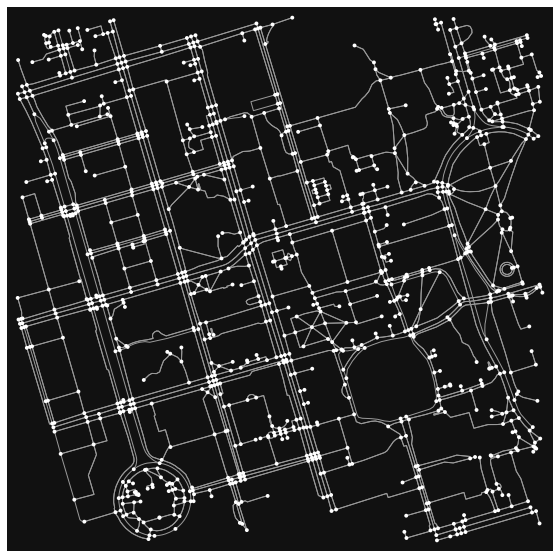

(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

In [10]:
new_graph = osmnx.graph_from_gdfs(nodes,edges)
osmnx.plot_graph(new_graph,figsize=(10,10))

#### Calculating Network Statistics

We can see some basic statistics of our graph using `osmnx.basic_stats`.

In [11]:
osmnx.basic_stats(graph)

{'n': 1090,
 'm': 3104,
 'k_avg': 5.695412844036698,
 'edge_length_total': 92073.89100000016,
 'edge_length_avg': 29.6629803479382,
 'streets_per_node_avg': 3.053211009174312,
 'streets_per_node_counts': {0: 0, 1: 154, 2: 0, 3: 579, 4: 349, 5: 7, 6: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.14128440366972478,
  2: 0.0,
  3: 0.5311926605504587,
  4: 0.3201834862385321,
  5: 0.006422018348623854,
  6: 0.0009174311926605505},
 'intersection_count': 936,
 'street_length_total': 48561.08599999995,
 'street_segment_count': 1613,
 'street_length_avg': 30.106066955982612,
 'circuity_avg': 1.0297899024310946,
 'self_loop_proportion': 0.0012399256044637321}

We can also see the circuity average. Circuity average is the sum of edge lengths divided by the sum of straight line distances. It produces a metric > 1 that indicates how "direct" the network is (i.e. how much extra distance must be travelled using the graph).

In [12]:
# osmnx expects an undirected graph
undir = graph.to_undirected()
osmnx.stats.circuity_avg(undir)

1.0328466941401129

#### Extended and Density Stats

ensity-based statistics requires knowing the area of the graph. To do this, we can first find the convex hull. Let's also look at some extended statistics.

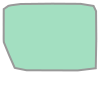

In [13]:
convex_hull = edges.unary_union.convex_hull
convex_hull

In [14]:
import pandas
area = convex_hull.area
stats = osmnx.basic_stats(graph, area=area)
extended_stats = osmnx.extended_stats(graph,ecc=True,cc=True)
stats.update(extended_stats)

# Show the data in a pandas Series for better formatting
pandas.Series(stats)

/home/yinan/book-env/lib/python3.8/site-packages/osmnx/stats.py:405: UserWarning: The extended_stats function has been deprecated and will be removed in a future release. Use NetworkX directly for extended topological measures.
  warnings.warn(msg)


n                                                                                   1090
m                                                                                   3104
k_avg                                                                           5.695413
edge_length_total                                                              92073.891
edge_length_avg                                                                 29.66298
streets_per_node_avg                                                            3.053211
streets_per_node_counts                 {0: 0, 1: 154, 2: 0, 3: 579, 4: 349, 5: 7, 6: 1}
streets_per_node_proportions           {0: 0.0, 1: 0.14128440366972478, 2: 0.0, 3: 0....
intersection_count                                                                   936
street_length_total                                                            48561.086
street_segment_count                                                                1613
street_length_avg    

:::{warning}
`extended_stats` has already been deprecated from `osmnx`. In the absence of an alternative, you can access these metrics directly through `networkx`.
:::

#### CRS Projection

You can also look at the projection of the graph. To find out more about projections, check out this [section](IntroductionToGeospatialScience.html#projection). Additionally, you can also reproject the graph to a different CRS.

In [15]:
edges.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [16]:
merc_edges = edges.to_crs(epsg=3857)
merc_edges.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Shortest Path Analysis

Let's revisit our trip across campus from the statue in Queen's Park to our lecture hall at the Bahen centre.

To calculate the shortest path, we first need to find the closest nodes on the network to our starting and ending locations.

In [31]:
import geopandas

X = [source_point[1], destination_point[1]]
Y = [source_point[0], destination_point[0]]
closest_nodes = osmnx.distance.nearest_nodes(graph,X,Y)

# Get the rows from the Node GeoDataFrame
closest_rows = nodes.loc[closest_nodes]

# Put the two nodes into a GeoDataFrame
od_nodes = geopandas.GeoDataFrame(closest_rows, geometry='geometry', crs=nodes.crs)
od_nodes

,y,x,highway,street_count,geometry
osmid,,,,,
1907446268,43.664507,-79.392304,NaN,3,POINT (-79.39230 43.66451)
1633421938,43.659750,-79.398047,NaN,1,POINT (-79.39805 43.65975)


Let's find and plot the shortest route now!

In [32]:
import networkx

shortest_route = networkx.shortest_path(G=graph,source=closest_nodes[0],target=closest_nodes[1], weight='length')
print(shortest_route)

[1907446268, 55808205, 55808194, 1907446267, 8699033082, 8699033084, 6542457312, 4953810914, 55808233, 299625330, 389677953, 7967019556, 7967019566, 4923076695, 55808571, 55808582, 389678112, 389678113, 389678146, 2143434862, 2143434860, 7311083158, 1258707987, 389678121, 50885147, 389678122, 389677906, 50885141, 389678180, 2143436415, 2143494216, 2143494214, 389678185, 1633421950, 389678184, 389678183, 389678216, 389678215, 389678226, 1633421933, 1633421938]


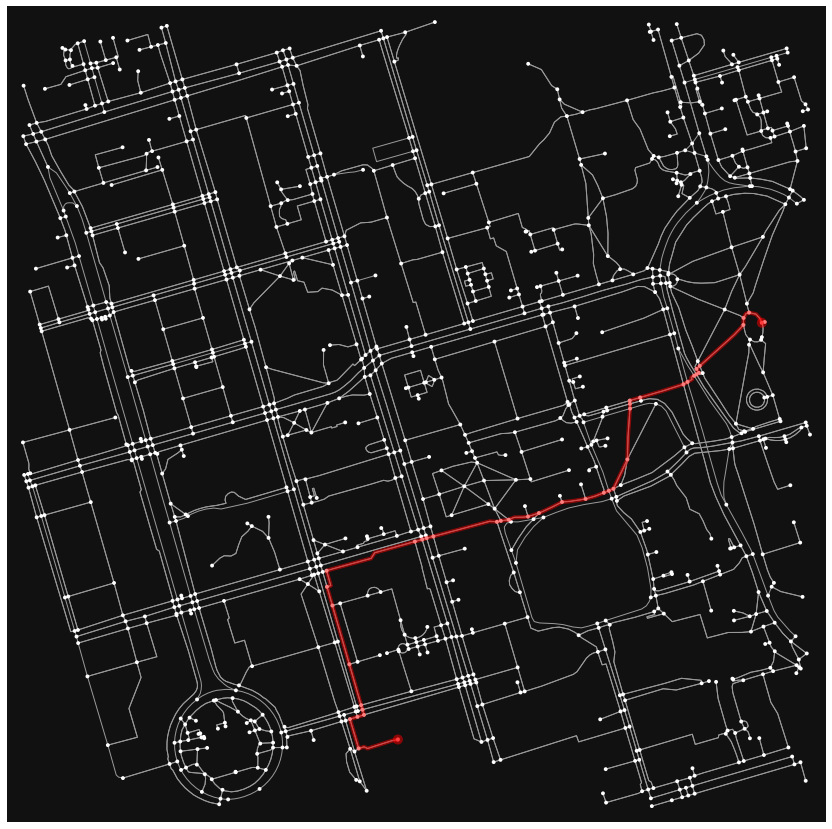

(<Figure size 1080x1080 with 1 Axes>, <AxesSubplot:>)

In [33]:
osmnx.plot_graph_route(graph,shortest_route,figsize=(15,15))